In [1]:
using DataFrames
using CSV
using Plots
using Plots.PlotMeasures
using Dates
gr();

┌ Info: Recompiling stale cache file C:\Users\Jimmie\.julia\compiled\v1.2\CSV\HHBkp.ji for CSV [336ed68f-0bac-5ca0-87d4-7b16caf5d00b]
└ @ Base loading.jl:1240


In [3]:
pandora = CSV.read("pandora_timed_2019_11_16.csv"; copycols=false); # DU
tropomi = CSV.read("total_output_2019_11_22_july_only.csv"; copycols=false); # moles/m^2
tropomi_weekday = CSV.read("total_output_2019_11_29_weekday.csv"; copycols=false); # moles/m^2
tropomi_weekend = CSV.read("total_output_2019_11_29_weekend.csv"; copycols=false); # moles/m^2

In [5]:
@show first(pandora, 2);
@show first(tropomi, 2);

@show last(tropomi, 2);

first(pandora, 2) = 2×9 DataFrame
│ Row │ Year  │ Month │ Day   │ Hour  │ Minute │ timestamp  │ VCD(DU) │ UNCERTAINTY(DU) │ SZA     │
│     │ Int64 │ Int64 │ Int64 │ Int64 │ Int64  │ Int64      │ Float64 │ Float64         │ Float64 │
├─────┼───────┼───────┼───────┼───────┼────────┼────────────┼─────────┼─────────────────┼─────────┤
│ 1   │ 2019  │ 6     │ 27    │ 14    │ 58     │ 1561647480 │ 0.82915 │ 0.0035108       │ 29.58   │
│ 2   │ 2019  │ 6     │ 27    │ 15    │ 2      │ 1561647720 │ 0.71166 │ 0.0046338       │ 28.86   │
first(tropomi, 2) = 2×16 DataFrame
│ Row │ cornerlat1 │ qa      │ time                        │ timestamp  │ cornerlat2 │ lons     │ cornerlon3 │ cloud      │ cornerlat4 │ cornerlon1 │ cornerlat3 │ cornerlon4 │ no2_error │ no2     │ cornerlon2 │ lats    │
│     │ Float64    │ Float64 │ String                      │ Int64      │ Float64    │ Float64  │ Float64    │ Float64    │ Float64    │ Float64    │ Float64    │ Float64    │ Float64   │ Float64 │ Float64    │

In [11]:
# moles/m^2 = 6.022e19 molecules/cm^2
tropomi_no2 = convert(Array{Float32, 1}, tropomi[!, :no2]) .* 6.022e19;
tropomi_no2_x = tropomi_no2 .* 2.0;

# 1 DU = 0.4462 mmol/m^2 = 2.6871e16 molecules/cm^2
pandora_no2 = convert(Array{Float32, 1}, pandora[!, 7]) .* 2.6871e16;

# Transform timestamps to days since 2019-07-01
ts_p = (pandora[!, :timestamp] .- 1562004287) ./ (24.0*3600.0)
ts_t = (tropomi[!, :timestamp] .- 1562004287) ./ (24.0*3600.0)

16992-element Array{Float64,1}:
  0.0                  
  0.0                  
  1.1574074074074073e-5
  1.1574074074074073e-5
  1.1574074074074073e-5
  1.1574074074074073e-5
  1.1574074074074073e-5
  1.1574074074074073e-5
  1.1574074074074073e-5
  1.1574074074074073e-5
  1.1574074074074073e-5
  1.1574074074074073e-5
  1.1574074074074073e-5
  ⋮                    
 30.02665509259259     
 30.02665509259259     
 30.02665509259259     
 30.026666666666667    
 30.026666666666667    
 30.026666666666667    
 30.026666666666667    
 30.026666666666667    
 30.026666666666667    
 30.026666666666667    
 30.026666666666667    
 30.026666666666667    

In [13]:
plot(ts_p, pandora_no2, xlim=(0, 31), ylim=(0, 1e16), xticks=0.0:1.0:31.0, size=(900, 500), markercolor=:royalblue, markersize=1, markerstrokewidth=0, seriestype=:scatter, label="Pandora", legend=:bottomright, xlabel="Day in July 2019", ylabel="NO2 [molecules cm-2]", guidefontsize=9, xrotation=90)
plot!(ts_t, tropomi_no2, markercolor=:brown3, markersize=1, markerstrokewidth=0, seriestype=:scatter, label="Tropomi")
# plot!(tropomi[!, :timestamp], tropomi_no2_x, markercolor=:green, markersize=1, markerstrokewidth=0, seriestype=:scatter, label="Tropomi x2")

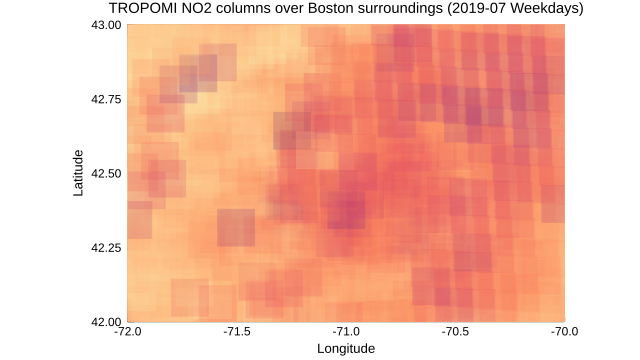

In [45]:
p1 = scatter(tropomi_weekday[!, :lons], tropomi_weekday[!, :lats], zcolor=abs.(tropomi_weekday[!, :no2] .* 1e4),
        colorbar_entry=false,
        markershape=:rect, markeralpha=0.2, 
        markercolor=:magma_r, # colormap
        markersize = 0.063 * 300, # Markersize is area of obs. (7km), roughly 0.063 degree x 0.063 degree
        markerstrokewidth = 0,
        size = (640, 360), # 1 degree ~ 300 px; aspect ratio is 1.47 length x 1.00 height
        label = "",
        framestyle=:box,
        titlefontsize=10,
        xlim=(-72.0, -70.0), ylim=(42.0, 43.0), clims=(0.0, 1.50), xlabel="Longitude", ylabel="Latitude",
        guidefontsize=9,
        left_margin=10px, right_margin=10px, aspect_ratio=1.36,
        title="TROPOMI NO2 columns over Boston surroundings (2019-07 Weekdays)",
) # ms=10 * abs.(y .- 0.5) .+ 4, 

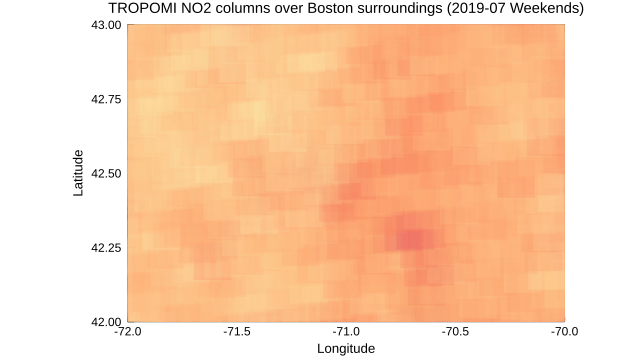

In [46]:
p2 = scatter(tropomi_weekend[!, :lons], tropomi_weekend[!, :lats], zcolor=abs.(tropomi_weekend[!, :no2] .* 1e4),
        colorbar_entry=false,
        markershape=:rect, markeralpha=0.2, 
        markercolor=:magma_r, # colormap
        markersize = 0.063 * 300, # Markersize is area of obs. (7km), roughly 0.063 degree x 0.063 degree
        markerstrokewidth = 0,
        size = (640, 360), # 1 degree ~ 300 px
        label = "",
        framestyle=:box,
        titlefontsize=10,
        xlim=(-72.0, -70.0), ylim=(42.0, 43.0), clims=(0.0, 1.50), xlabel="Longitude", ylabel="Latitude",
        guidefontsize=9,
        left_margin=10px, right_margin=10px, aspect_ratio=1.36,
        title="TROPOMI NO2 columns over Boston surroundings (2019-07 Weekends)",
) # ms=10 * abs.(y .- 0.5) .+ 4, 

In [ ]:
scatter(tropomi[!, :lons], tropomi[!, :lats], zcolor=abs.(tropomi[!, :no2]),
        colorbar_entry=false,
        markershape=:rect, markeralpha=0.2, 
        markercolor=:magma_r, # colormap
        markersize = 0.063 * 300, # Markersize is area of obs. (7km), roughly 0.063 degree x 0.063 degree
        markerstrokewidth = 0,
        size = (640, 340), # 1 degree ~ 300 px
        label = "",
        framestyle=:box,
        titlefontsize=10,
        xlim=(-72.0, -70.0), ylim=(42.0, 43.0), xlabel="Longitude", ylabel="Latitude",
        guidefontsize=9,
        left_margin=10px, right_margin=10px,
        title="TROPOMI NO2 columns over Boston surroundings (2019-07-15 - 2019-07-30)",
) # ms=10 * abs.(y .- 0.5) .+ 4, 

In [29]:
scatter(tropomi[!, :lons], tropomi[!, :lats], zcolor=abs.(tropomi[!, :no2]),
        colorbar_entry=false,
        markershape=:rect, markeralpha=0.2, 
        markercolor=:magma_r, # colormap
        markersize = 0.063 * 300, # Markersize is area of obs. (7km), roughly 0.063 degree x 0.063 degree
        markerstrokewidth = 0,
        size = (640, 340), # 1 degree ~ 300 px
        label = "",
        framestyle=:box,
        titlefontsize=10,
        xlim=(-72.0, -70.0), ylim=(42.0, 43.0), xlabel="Longitude", ylabel="Latitude",
        guidefontsize=9,
        left_margin=10px, right_margin=10px,
        title="TROPOMI NO2 columns over Boston surroundings (2019-07-01 - 2019-08-30)",
) # ms=10 * abs.(y .- 0.5) .+ 4, 